<a href="https://colab.research.google.com/github/paula-martinezmoreno/New-York-Taxi-Trips-Analysis/blob/main/NYC_taxis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 2

authors: **Bragina Natalia, Martinez Paula**

In [2]:
!pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488491 sha256=f80dfa460498b8c793c768fe17e0134bc712fd4c74a56c2b4fcca54dc834507a
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark


In [3]:
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None
import pyarrow as pa
import pyarrow.parquet as pq

from pyspark.context import SparkContext
from pyspark.sql import SparkSession
from pyspark.sql.session import SparkSession
from pyspark.sql import Row
from pyspark.sql.types import *
from pyspark.sql import functions as fn
from pyspark.sql.functions import min, max, count
from pyspark.sql.functions import dayofweek, hour, month, year, date_format, unix_timestamp
from pandas.api.types import CategoricalDtype

from shapely.geometry import Polygon, LineString, Point

import os
import io
import time
import requests
import urllib.request
import json
import csv
from zipfile import ZipFile

from pathlib import Path
from datetime import date
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as colors
sns.set()

import geopandas as gpd
from geopandas import GeoDataFrame

import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

from IPython.display import display, IFrame
from ipywidgets import interact, widgets

spark = (SparkSession
    .builder
    .master('local[*]')
    .appName("NY_taxi_analyse")
    .getOrCreate()
)

In [4]:
# Uploaded data files will be stocked in current working directory of a process + 'data'
dirpath = os.path.join(".", 'data') + os.sep

params = dict(
    y_april_2019_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2019-04.parquet',
    y_april_2020_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2020-04.parquet',
    y_april_2021_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2021-04.parquet',
    y_april_2022_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2022-04.parquet',

    fhv_april_2019_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/fhv_tripdata_2019-04.parquet',
    fhv_april_2020_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/fhv_tripdata_2020-04.parquet',
    fhv_april_2021_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/fhv_tripdata_2021-04.parquet',
    fhv_april_2022_url = 'https://d37ci6vzurychx.cloudfront.net/trip-data/fhv_tripdata_2022-04.parquet',

    taxi_zones_url = 'https://data.cityofnewyork.us/api/geospatial/d3c5-ddgc?method=export&format=GeoJSON',

    y_april_2019 = os.path.join(dirpath, 'yellow_tripdata_2019-04.parquet'),
    y_april_2020 = os.path.join(dirpath, 'yellow_tripdata_2020-04.parquet'),
    y_april_2021 = os.path.join(dirpath, 'yellow_tripdata_2021-04.parquet'),
    y_april_2022 = os.path.join(dirpath, 'yellow_tripdata_2022-04.parquet'),


    fhv_april_2019 = os.path.join(dirpath, 'fhv_tripdata_2019-04.parquet'),
    fhv_april_2020 = os.path.join(dirpath, 'fhv_tripdata_2020-04.parquet'),
    fhv_april_2021 = os.path.join(dirpath, 'fhv_tripdata_2021-04.parquet'),
    fhv_april_2022 = os.path.join(dirpath, 'fhv_tripdata_2022-04.parquet'),

    taxi_zones_geojson = os.path.join(dirpath, 'taxi_zones.geojson')
)

# Create a directory if it does not exist
if not Path(dirpath).exists():
    %mkdir {dirpath}

## Downloading

In [5]:
# Yellow taxy
if not Path(params['y_april_2019']).exists():
    r = requests.get(params['y_april_2019_url'])
    if (r.status_code == 200):
        f = open(params['y_april_2019'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['y_april_2019']} has been successfully downloaded.")

if not Path(params['y_april_2020']).exists():
    r = requests.get(params['y_april_2020_url'])
    if (r.status_code == 200):
        f = open(params['y_april_2020'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['y_april_2020']} has been successfully downloaded.")

if not Path(params['y_april_2021']).exists():
    r = requests.get(params['y_april_2021_url'])
    if (r.status_code == 200):
        f = open(params['y_april_2021'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['y_april_2021']} has been successfully downloaded.")

if not Path(params['y_april_2022']).exists():
    r = requests.get(params['y_april_2022_url'])
    if (r.status_code == 200):
        f = open(params['y_april_2022'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['y_april_2022']} has been successfully downloaded.")

File ./data/yellow_tripdata_2019-04.parquet has been successfully downloaded.
File ./data/yellow_tripdata_2020-04.parquet has been successfully downloaded.
File ./data/yellow_tripdata_2021-04.parquet has been successfully downloaded.
File ./data/yellow_tripdata_2022-04.parquet has been successfully downloaded.


In [6]:
# FHV
if not Path(params['fhv_april_2019']).exists():
    r = requests.get(params['fhv_april_2019_url'])
    if (r.status_code == 200):
        f = open(params['fhv_april_2019'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['fhv_april_2019']} has been successfully downloaded.")

if not Path(params['fhv_april_2020']).exists():
    r = requests.get(params['fhv_april_2020_url'])
    if (r.status_code == 200):
        f = open(params['fhv_april_2020'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['fhv_april_2020']} has been successfully downloaded.")

if not Path(params['fhv_april_2021']).exists():
    r = requests.get(params['fhv_april_2021_url'])
    if (r.status_code == 200):
        f = open(params['fhv_april_2021'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['fhv_april_2021']} has been successfully downloaded.")

if not Path(params['fhv_april_2022']).exists():
    r = requests.get(params['fhv_april_2022_url'])
    if (r.status_code == 200):
        f = open(params['fhv_april_2022'],'wb')
        f.write(r.content)
        f.close()
        print(f"File {params['fhv_april_2022']} has been successfully downloaded.")

File ./data/fhv_tripdata_2019-04.parquet has been successfully downloaded.
File ./data/fhv_tripdata_2020-04.parquet has been successfully downloaded.
File ./data/fhv_tripdata_2021-04.parquet has been successfully downloaded.
File ./data/fhv_tripdata_2022-04.parquet has been successfully downloaded.


In [7]:
if not Path(params['taxi_zones_geojson']).exists():
    urllib.request.urlretrieve(params['taxi_zones_url'], params['taxi_zones_geojson'])
geo_df1 = GeoDataFrame.from_file(params['taxi_zones_geojson'])
geo_df1

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."
...,...,...,...,...,...,...,...
258,0.000168611097013,256,0.0679149669603,256,Williamsburg (South Side),Brooklyn,"MULTIPOLYGON (((-73.95834 40.71331, -73.95681 ..."
259,0.000394552487366,259,0.126750305191,259,Woodlawn/Wakefield,Bronx,"MULTIPOLYGON (((-73.85107 40.91037, -73.85207 ..."
260,0.000422345326907,260,0.133514154636,260,Woodside,Queens,"MULTIPOLYGON (((-73.90175 40.76078, -73.90147 ..."
261,0.0000343423231652,261,0.0271204563616,261,World Trade Center,Manhattan,"MULTIPOLYGON (((-74.01333 40.70503, -74.01327 ..."


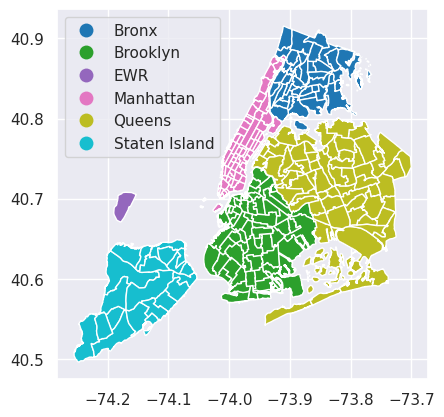

In [8]:
geo_df1.plot(column='borough', categorical=True, legend=True, legend_kwds={'loc': 'upper left'})
plt.show()
geo_df1['objectid'] = geo_df1['objectid'].astype('int32')
geo_df1['location_id'] = geo_df1['location_id'].astype('int32')

## NYC Boroughs:    Bronx, Brooklyn, Manhattan, Queens, Staten Island


# Yellow Taxy Legend

**VendorID** A code indicating the TPEP provider that provided the record.

- `1` Creative Mobile Technologies, LLC
- `2` VeriFone Inc


**RateCodeID** The final rate code in effect at the end of the trip.

- `1` Standard rate
- `2` JFK
- `3` Newark
- `4` Nassau or Westchester
- `5` Negotiated fare
- `6` Group ride

**Store_and_fwd_flag** This flag indicates whether the trip record was held in vehicle memory before sending to the vendor, aka “store and forward,” because the vehicle did not have a connection to the server.
- `Y` store and forward trip
- `N` not a store and forward trip

**Payment_type** A numeric code signifying how the passenger paid for the trip.
- `1` Credit card
- `2` Cash
- `3` No charge
- `4` Dispute
- `5` Unknown
- `6` Voided trip


**Fare_amount** The time-and-distance fare calculated by the meter.

**Extra** Miscellaneous extras and surcharges. Currently, this only includes the `$0.50` and `$1` rush hour and overnight charges.

**MTA_tax** `$0.50` MTA tax that is automatically triggered based on the metered rate in use.

**Improvement_surcharge** `$0.30` improvement surcharge assessed trips at the flag drop. The improvement surcharge began being levied in 2015.

**Tip_amount** Tip amount – This field is automatically populated for credit card tips. Cash tips are not included.

**Tolls_amount** Total amount of all tolls paid in trip.

**Total_amount** The total amount charged to passengers. Does not include cash tips.

**Congestion_Surcharge** Total amount collected in trip for NYS congestion surcharge.

**Airport_fee** `$1.25` for pick up only at LaGuardia and John F. Kennedy Airports


# FHV Legend
FHV data includes trip data from high-volume for-hire vehicle bases (bases for companies dispatching 10,000+ trip per day, meaning Uber, Lyft, Via, and Juno), community livery bases, luxury limousine bases, and black car bases.

**Dispatching_base_num** The TLC Base License Number of the base that dispatched the trip

**Pickup_datetime** The date and time of the trip pick-up

**DropOff_datetime** The date and time of the trip dropoff

**PULocationID** TLC Taxi Zone in which the trip began

**DOLocationID** TLC Taxi Zone in which the trip ended

**SR_Flag** Indicates if the trip was a part of a shared ride chain offered by a High Volume FHV company (e.g. Uber Pool, Lyft Line). For shared trips, the value is `1`. For non-shared rides, this field is `null`.

`NOTE`: For most High Volume FHV companies, only shared rides that were requested AND matched to another shared-ride request over the course of the journey are flagged. However, Lyft (base license numbers `B02510` + `B02844`) also flags rides for which a shared ride was requested but another passenger was not successfully matched to share the trip—therefore, trips records with SR_Flag=1 from those two bases could indicate EITHER a first trip in a shared trip chain OR a trip for which a shared ride was requested but never matched. Users should anticipate an overcount of successfully shared trips completed by Lyft.


In [9]:
# Additional data
boroughs_zones = geo_df1[['zone', 'location_id', 'borough']]

# Data
df_Y_april_2019 = spark.read.parquet(params['y_april_2019'])
df_Y_april_2020 = spark.read.parquet(params['y_april_2020'])
df_Y_april_2021 = spark.read.parquet(params['y_april_2021'])
df_Y_april_2022 = spark.read.parquet(params['y_april_2022'])

# Casts to types that take up less memory and additional calculations (trip durations)
listDFs = [df_Y_april_2019, df_Y_april_2020, df_Y_april_2021, df_Y_april_2022]
for i in range(4):
    listDFs[i] = listDFs[i].withColumn("PULocationID", listDFs[i]["PULocationID"].cast('int'))
    listDFs[i] = listDFs[i].withColumn("DOLocationID", listDFs[i]["DOLocationID"].cast('int'))
    listDFs[i] = listDFs[i].withColumn("passenger_count", listDFs[i]["passenger_count"].cast('int'))
    listDFs[i] = listDFs[i].withColumn("payment_type", listDFs[i]["payment_type"].cast('int'))
    listDFs[i] = listDFs[i].withColumn("RatecodeID", listDFs[i]["RatecodeID"].cast('int'))
    listDFs[i] = listDFs[i].withColumn('trip_duration', (unix_timestamp('tpep_dropoff_datetime') - unix_timestamp('tpep_pickup_datetime'))/60)

df_Y_april_2019 = listDFs[0]
df_Y_april_2020 = listDFs[1]
df_Y_april_2021 = listDFs[2]
df_Y_april_2022 = listDFs[3]

df_Y_april_2019.printSchema()

root
 |-- VendorID: long (nullable = true)
 |-- tpep_pickup_datetime: timestamp_ntz (nullable = true)
 |-- tpep_dropoff_datetime: timestamp_ntz (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: integer (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: integer (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- airport_fee: integer (nullable = true)
 |-- trip_duration: double (nullable = true)



In [10]:
# Register the DataFrames as temporary tables
df_Y_april_2019.registerTempTable("trips_y_2019")
df_Y_april_2020.registerTempTable("trips_y_2020")
df_Y_april_2021.registerTempTable("trips_y_2021")
df_Y_april_2022.registerTempTable("trips_y_2022")

# Perform UNION ALL to combine the DataFrames
combined_taxis_df = spark.sql("""
    SELECT *
    FROM trips_y_2019
    UNION ALL
    SELECT *
    FROM trips_y_2020
    UNION ALL
    SELECT *
    FROM trips_y_2021
    UNION ALL
    SELECT *
    FROM trips_y_2022
""")

# Register the new DataFrame so that we can do EDA
combined_taxis_df.registerTempTable("combined_taxis")
# Show the combined DataFrame
combined_taxis_df.printSchema()

root
 |-- VendorID: long (nullable = true)
 |-- tpep_pickup_datetime: timestamp_ntz (nullable = true)
 |-- tpep_dropoff_datetime: timestamp_ntz (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: integer (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: integer (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- airport_fee: double (nullable = true)
 |-- trip_duration: double (nullable = true)



In [12]:
df_fhv_april_2019 = spark.read.parquet(params['fhv_april_2019'])
df_fhv_april_2020 = spark.read.parquet(params['fhv_april_2020'])
df_fhv_april_2021 = spark.read.parquet(params['fhv_april_2021'])
df_fhv_april_2022 = spark.read.parquet(params['fhv_april_2022'])

# Casts to types that take up less memory and additional calculations (trip durations)
listFHVDFs = [df_fhv_april_2019, df_fhv_april_2020, df_fhv_april_2021, df_fhv_april_2022]
for i in range(4):
    listFHVDFs[i] = listFHVDFs[i].withColumn("PUlocationID", listFHVDFs[i]["PUlocationID"].cast('int'))
    listFHVDFs[i] = listFHVDFs[i].withColumn("DOlocationID", listFHVDFs[i]["DOlocationID"].cast('int'))
    listFHVDFs[i] = listFHVDFs[i].withColumn('trip_duration', (unix_timestamp('dropOff_datetime') - unix_timestamp('pickup_datetime'))/60)

df_fhv_april_2019 = listFHVDFs[0]
df_fhv_april_2020 = listFHVDFs[1]
df_fhv_april_2021 = listFHVDFs[2]
df_fhv_april_2022 = listFHVDFs[3]

# Register the DataFrames as temporary tables
df_fhv_april_2019.registerTempTable("trips_fhv_2019")
df_fhv_april_2020.registerTempTable("trips_fhv_2020")
df_fhv_april_2021.registerTempTable("trips_fhv_2021")
df_fhv_april_2022.registerTempTable("trips_fhv_2022")

# Perform UNION ALL to combine the DataFrames
combined_fhv_df = spark.sql("""
    SELECT *
    FROM trips_fhv_2019
    UNION ALL
    SELECT *
    FROM trips_fhv_2020
    UNION ALL
    SELECT *
    FROM trips_fhv_2021
    UNION ALL
    SELECT *
    FROM trips_fhv_2022
""")


# Register the new DataFrame so that we can do EDA
combined_fhv_df.registerTempTable("combined_fhv")
# Show the combined DataFrame
combined_fhv_df.printSchema()


root
 |-- dispatching_base_num: string (nullable = true)
 |-- pickup_datetime: timestamp_ntz (nullable = true)
 |-- dropOff_datetime: timestamp_ntz (nullable = true)
 |-- PUlocationID: integer (nullable = true)
 |-- DOlocationID: integer (nullable = true)
 |-- SR_Flag: integer (nullable = true)
 |-- Affiliated_base_number: string (nullable = true)
 |-- trip_duration: double (nullable = true)



# Data Check

There could be some errors in the data we have dowloaded, we are going to check some information in order to have a good judgement of the conclusions we are going to obtein.

We are going to start with the taxis data frame.

In [13]:
combined_taxis_df.select("total_amount").describe().toPandas()

,summary,total_amount
0,count,13485129
1,mean,19.690968068881684
2,stddev,153.24359941252607
3,min,-2567.8
4,max,395854.74


We can observe that **the minimum amount charged for a trip is less than 0 dollars** and the **maximum amount is almost 40,000 dollars**, which in both cases seems unlikely and almost even impossible given the data frame. Therefore, we can assume that there is an error in the data.

In [14]:
combined_taxis_df.select("trip_distance").describe().toPandas()

,summary,trip_distance
0,count,13485129
1,mean,4.459141183595605
2,stddev,421.62195028586905
3,min,0.0
4,max,329408.43


There seem to be an error in trips_distance, because it is while it is possible to travel less than 0 milles (we are going to considere the trips with 0 milles in trip_distance as cancelled trips) and **it seems unlikely to travel more than 1000 milles given the data frame**.

In [15]:
combined_taxis_df.select("passenger_count").describe().toPandas()

,summary,passenger_count
0,count,13176199
1,mean,1.5007056283834208
2,stddev,1.1338909823245908
3,min,0
4,max,9


In the case of number of passengers per trip, the maximum is 9 which is not imposible, there are cars for 9 people. We can conclude the data in this case seems to be right.

In [16]:
# Calculate the min and max dates
min_date = combined_taxis_df.agg(min("tpep_pickup_datetime")).collect()[0][0]
max_date = combined_taxis_df.agg(max("tpep_dropoff_datetime")).collect()[0][0]

# Print the min and max dates
print("Minimum Date:", min_date)
print("Maximum Date:", max_date)

Minimum Date: 2008-08-08 09:13:28
Maximum Date: 2033-04-27 13:13:27


We can observe another error in the dates, **we are only interested in dates betweeen april 2019 to april 2022**.

Considering all the incorrect data, we are going to update our date frame:

In [17]:
# Filtering out problematic data: The total amount charged per trip, the trip_distance, the dates.
combined_taxis_df2 = spark.sql("""
SELECT
    *
FROM
    combined_taxis as c
WHERE
    c.total_amount < 10000
    AND c.total_amount > 0
    AND c.trip_distance < 1000
    AND c.tpep_pickup_datetime >= '2019-04-01'
    AND c.tpep_dropoff_datetime <= '2022-04-30'
""")

# Re-register the new DataFrame so that we can do EDA based on the clean data
combined_taxis_df2.registerTempTable("combined_taxis2")
# Show the combined clean DataFrame
combined_taxis_df2.show()

+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|VendorID|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|RatecodeID|store_and_fwd_flag|PULocationID|DOLocationID|payment_type|fare_amount|extra|mta_tax|tip_amount|tolls_amount|improvement_surcharge|total_amount|congestion_surcharge|airport_fee|     trip_duration|
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|       1| 2019-04-01 00:04:09|  2019-04-01 00:06:35|              1|          0.5|         1|                 N|         239|    

We are going to do the same for FHV:

In [18]:
# Calculate the min and max dates
min_date = combined_fhv_df.agg(min("pickup_datetime")).collect()[0][0]
max_date = combined_fhv_df.agg(max("dropOff_datetime")).collect()[0][0]

# Print the min and max dates
print("Minimum Date:", min_date)
print("Maximum Date:", max_date)

Minimum Date: 2019-04-01 00:00:00
Maximum Date: 2919-04-14 15:29:08


Observing this data, we can see a clear **error in the last day we need to analyze**.

We are going to fix the problem:

In [19]:
# Filtering out problematic data: The total amount charged per trip, the trip_distance, the dates.
combined_fhv_df2 = spark.sql("""
SELECT
    *
FROM
    combined_fhv as c
WHERE
    c.pickup_datetime >= '2019-04-01'
    AND c.dropOff_datetime <= '2022-04-30'

""")

# Re-register the new DataFrame so that we can do EDA based on the clean data
combined_fhv_df2.registerTempTable("combined_fhv2")
# Show the combined clean DataFrame
combined_fhv_df2.show()

+--------------------+-------------------+-------------------+------------+------------+-------+----------------------+------------------+
|dispatching_base_num|    pickup_datetime|   dropOff_datetime|PUlocationID|DOlocationID|SR_Flag|Affiliated_base_number|     trip_duration|
+--------------------+-------------------+-------------------+------------+------------+-------+----------------------+------------------+
|              B00013|2019-04-01 00:15:00|2019-04-01 00:55:36|         264|         264|   NULL|                B00013|              40.6|
|              B00013|2019-04-01 00:11:00|2019-04-01 00:31:39|         264|         264|   NULL|                B00013|             20.65|
|              B00014|2019-04-01 00:25:00|2019-04-01 00:55:36|         264|         264|   NULL|                B00014|              30.6|
|              B00014|2019-04-01 00:09:36|2019-04-01 00:40:12|         264|         264|   NULL|                B00014|              30.6|
|              B00014|2019-

# Investigation of one month of data in 2019

Using these boundaries, filter the 2019 data (using pickup and dropoff longitude and latitude) and count the number of trips for each value of passenger_count and make a plot of that.

In [20]:
from pyspark.sql.functions import col

long_min = -74.10
long_max = -73.70
lat_min = 40.58
lat_max = 40.90

# Find zones in rectagle
dfData = geo_df1[['objectid', 'zone', 'geometry']]
polygon = Polygon([(long_min, lat_min), (long_min, lat_max), (long_max, lat_max), (long_max, lat_min)])
listGeometriesIn = [elt for elt in dfData['geometry'] if polygon.contains(elt)]
selectedObjectId = dfData.loc[dfData['geometry'].isin(listGeometriesIn)]['objectid'].tolist()

print('Nb of zones in rectangle : ' + str(len(listGeometriesIn)))

# ZONES WITH PICKUPS AND DROPOFFS IN RECTANGLE
df_Zones_In_Rectangle = (combined_taxis_df2
      .filter((combined_taxis_df2['PULocationID'].isin(selectedObjectId))&(combined_taxis_df2['DOLocationID'].isin(selectedObjectId))
             ))


Nb of zones in rectangle : 235


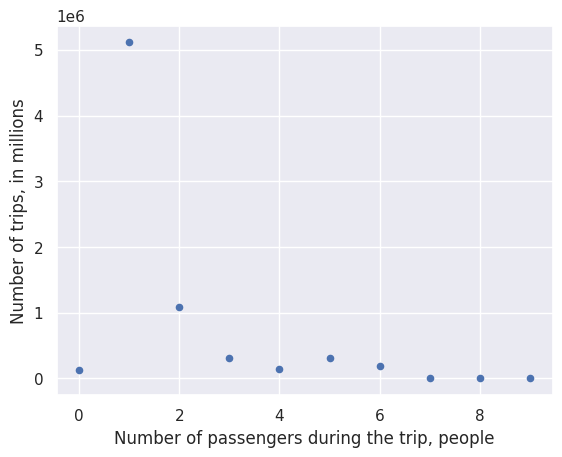

In [21]:
# Find nb of trips by each value of passenger_count
df_Zones_In_Rectangle.createOrReplaceTempView("nb_of_trips_by_passenger_in_rectagle")

# Create a query
q1 = """
    SELECT passenger_count, COUNT(*) AS trip_count
    FROM nb_of_trips_by_passenger_in_rectagle
    WHERE YEAR(tpep_pickup_datetime) = 2019 AND MONTH(tpep_pickup_datetime) = 4
    GROUP BY passenger_count
"""
# Number of trips by each value of passenger_count
nb_of_trips_by_passenger = spark.sql(q1).toPandas()

# Plot
ax = nb_of_trips_by_passenger.plot.scatter(x = 'passenger_count', y = 'trip_count', s = 20)
ax.set_ylabel('Number of trips, in millions')
ax.set_xlabel('Number of passengers during the trip, people')

plt.show()

1. What’s special with trips with zero passengers?

There are no any specifics for trips with number of passengers = 0.
Given that drivers enter these data manually, it can be concluded that all records with a zero number of passengers should be treated as erroneous data and should not be used in further analysis.

2. What’s special with trips with more than 6 passengers?

In total there are 58 such records with more than 6 passengers. Most of them have zero distance.

https://www.nyc.gov/site/tlc/passengers/passenger-frequently-asked-questions.page

    The maximum amount of passengers allowed in a yellow taxicab by law is four (4) in a four (4) passenger taxicab or five (5) passengers in a five (5) passenger taxicab, except that an additional passenger must be accepted if such passenger is under the age of seven (7) and is held on the lap of an adult passenger seated in the rear.
    
We may also regard such entries as erroneous and not accept them for further consideration.

In [22]:
# Filter  passengers_count = 0 and > 6
df_Zones_In_Rectangle.createOrReplaceTempView("filtered_by_nb_passengers")

q2 = """
    SELECT *
    FROM filtered_by_nb_passengers
    WHERE YEAR(tpep_pickup_datetime) = 2019
    AND MONTH(tpep_pickup_datetime) = 4
    AND (passenger_count <= 6 AND passenger_count > 0)
"""

df_Filtered_by_Nb_Passengers = spark.sql(q2)

3. What is the largest distance travelled during this month? Is it the first taxi on the moon?

In [23]:
df_Filtered_by_Nb_Passengers.createOrReplaceTempView("largest_distance_travelled")

# Query 'largest distance travelled during this month'
q3 = """
    SELECT tpep_pickup_datetime, tpep_dropoff_datetime, passenger_count, trip_distance, PULocationID, DOLocationID, payment_type, total_amount
    FROM largest_distance_travelled
    WHERE trip_distance = (SELECT MAX(trip_distance) FROM largest_distance_travelled)
"""
df_largest_distance_travelled = spark.sql(q3)

print("Largest distance travelled during april 2019")
df_largest_distance_travelled.show()

dist = df_largest_distance_travelled.take(1)[0].trip_distance

print("No, it is " + str(round(238900/dist, 2)) + " times smaller than the distance from Earth to the Moon")

Largest distance travelled during april 2019
+--------------------+---------------------+---------------+-------------+------------+------------+------------+------------+
|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|PULocationID|DOLocationID|payment_type|total_amount|
+--------------------+---------------------+---------------+-------------+------------+------------+------------+------------+
| 2019-04-27 23:42:13|  2019-04-27 23:49:48|              1|        830.9|         234|         186|           1|       12.95|
+--------------------+---------------------+---------------+-------------+------------+------------+------------+------------+

No, it is 287.52 times smaller than the distance from Earth to the Moon


4. Plot the distribution of the trip_distance (using an histogram for instance) during year 2019.Focus on trips with non-zero trip distance and trip distance less than 30 miles.

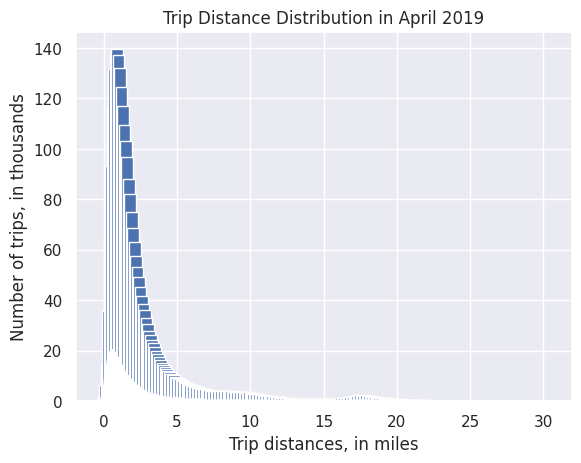

In [24]:
df_Filtered_by_Nb_Passengers.createOrReplaceTempView("distribution_of_the_trip_distance")

# Query 'find the number of trips for each distance and present them in order of increasing distance'
q5 = """
    SELECT trip_distance, COUNT(trip_distance)/1000 AS nb_of_trips
    FROM distribution_of_the_trip_distance
    WHERE trip_distance > 0 AND trip_distance < 30
    GROUP BY trip_distance
    SORT BY trip_distance
"""
df_distribution = spark.sql(q5).toPandas()

# Plot the trip distance distribution
plt.bar(df_distribution["trip_distance"], df_distribution["nb_of_trips"])
plt.xlabel('Trip distances, in miles')
plt.ylabel('Number of trips, in thousands')
plt.title('Trip Distance Distribution in April 2019')
plt.show()

Use the explain method or have a look at the Spark UI to analyze the job. You should
be able to assess
• Parsed Logical Plan
• Analyzed Logical Plan
• Optimized Logical Plan
• Physical Plan

In [25]:
spark.conf.set("spark.sql.codegen.wholeStage", False)

expl = spark.sql(q5).explain(True)
display(expl)

== Parsed Logical Plan ==
'Sort ['trip_distance ASC NULLS FIRST], false
+- 'Aggregate ['trip_distance], ['trip_distance, ('COUNT('trip_distance) / 1000) AS nb_of_trips#1772]
   +- 'Filter (('trip_distance > 0) AND ('trip_distance < 30))
      +- 'UnresolvedRelation [distribution_of_the_trip_distance], [], false

== Analyzed Logical Plan ==
trip_distance: double, nb_of_trips: double
Sort [trip_distance#4 ASC NULLS FIRST], false
+- Aggregate [trip_distance#4], [trip_distance#4, (cast(count(trip_distance#4) as double) / cast(1000 as double)) AS nb_of_trips#1772]
   +- Filter ((trip_distance#4 > cast(0 as double)) AND (trip_distance#4 < cast(30 as double)))
      +- SubqueryAlias distribution_of_the_trip_distance
         +- View (`distribution_of_the_trip_distance`, [VendorID#0L,tpep_pickup_datetime#1,tpep_dropoff_datetime#2,passenger_count#193,trip_distance#4,RatecodeID#233,store_and_fwd_flag#6,PULocationID#152,DOLocationID#173,payment_type#213,fare_amount#10,extra#11,mta_tax#12,tip_amou

None

Do the Analyzed Logical Plan and Optimized Logical Plan differ? Spot the differences
if any. How would a RDBMS proceed with such a query?

__Analyzed Logical Plan__ make

    Sort        
        Aggregate                
            Filter ( trip_distance > 0 and < 30 miles)           
                complexly nested in each other and one after another previous subqueries and unions made on previous views

__Optimized Logical Plan__ make

    Sort        
        Aggregate    
            Union
                Filter (all filters, casts and isin made in previous views are done in one time)


_To optimise this type of query `RDBMS` groupe all filters with isnotnull and execute them first, which immediately reduces the amount of data for further work._

How does the physical plan differ from the Optimized Logical Plan? What are the
keywords you would not expects in a RDBMS? What is their meaning?

_In Physical Plan "low level" operations such as hashaggregating, hashpartitioning and scaning of parquet file are also listed._

Inspect the stages on Spark UI. How many stages are necessary to complete the Spark
job? What are the roles of HashAggregate and Exchange hashpartitioning?

_`HashAggregate` is a hash-based physical operation that is executed then it is necessairy to make logical aggregation._

_`Exchange hashpartitioning` provide the expression and the number of partitions to execute hash aggregation. So aggregation will be executed hash(key) modulo number of partitions._

### Relevant

Break down the trip distance distribution for each day of week

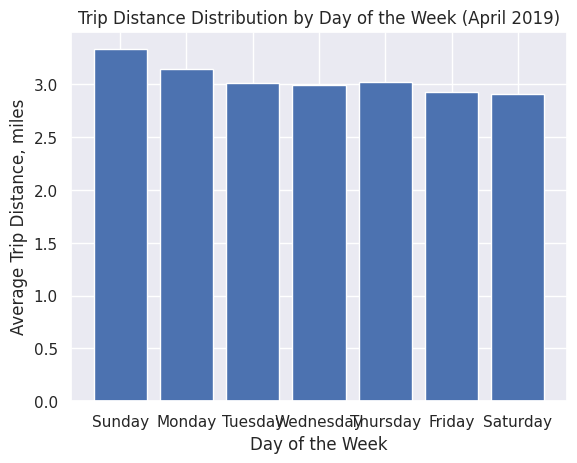

In [26]:
#Create a temporary view for the DataFrame
combined_taxis_df2.createOrReplaceTempView("combined_taxis2_view")

# Create a query
query = """
    SELECT DATE_FORMAT(tpep_pickup_datetime, 'EEEE') AS pickup_day_of_week, AVG(trip_distance) AS avg_trip_distance
    FROM combined_taxis2_view
    WHERE YEAR(tpep_pickup_datetime) = 2019 AND MONTH(tpep_pickup_datetime) = 4
    GROUP BY pickup_day_of_week, DAYOFWEEK(tpep_pickup_datetime)
    ORDER BY DAYOFWEEK(tpep_pickup_datetime)
"""

avg_trip_distance_by_day = spark.sql(query)

#Convert DataFrame to Pandas for plotting
avg_trip_distance_pandas = avg_trip_distance_by_day.toPandas()

# Plot the trip distance distribution
plt.bar(avg_trip_distance_pandas["pickup_day_of_week"], avg_trip_distance_pandas["avg_trip_distance"])
plt.xlabel('Day of the Week')
plt.ylabel('Average Trip Distance, miles')
plt.title('Trip Distance Distribution by Day of the Week (April 2019)')
plt.show()

Count the number of distinct pickup location

In [27]:
# Create a temporary view for the DataFrame
combined_taxis_df2.createOrReplaceTempView("combined_taxis2_view")

# Perform the analysis using Spark SQL
query = """
    SELECT COUNT(DISTINCT PULocationID) AS distinct_pickup_locations
    FROM combined_taxis2_view
"""

distinct_pickup_locations = spark.sql(query).first()[0]

print("Number of distinct pickup locations:", distinct_pickup_locations)


Number of distinct pickup locations: 263


Compute and display tips and profits as a function of the pickup location

In [28]:
# Query for tips and profits in April 2019
q_tips_profits = """
SELECT
    PULocationID,
    ROUND( AVG(fare_amount + extra), 1) AS avg_fare,
    COUNT(tip_amount) AS quantity_tips, ROUND( AVG(tip_amount), 1) as avg_tip
FROM
    combined_taxis2_view AS c
WHERE
    MONTH(c.tpep_pickup_datetime) = 4
    AND YEAR(c.tpep_pickup_datetime) = 2019
GROUP BY
    PULocationID
ORDER BY avg_fare DESC
"""

df_tips_profits = spark.sql(q_tips_profits).toPandas()

df_tips_profits = df_tips_profits.merge(boroughs_zones, left_on='PULocationID', right_on='location_id')

# make interactive UI
listNames = df_tips_profits['zone'].values.tolist()

def get_report(TaxiZone):
    fare = df_tips_profits['avg_fare'].loc[df_tips_profits['zone'] == TaxiZone].values[0]
    tips = df_tips_profits['avg_tip'].loc[df_tips_profits['zone'] == TaxiZone].values[0]
    count = df_tips_profits['quantity_tips'].loc[df_tips_profits['zone'] == TaxiZone].values[0]
    print(f'In April 2019 for taxi zone {TaxiZone} :\naverage fare was {fare} \naverage tips were {tips}, wich was given {count} times')
widgets.interact(get_report, TaxiZone=listNames)

#print("Top-20 of taxi zones with highest fares and the tips of passengers, April 2019:")
#display(df_tips_profits.head(20))

# show
m = folium.Map(location=[40.7594,-73.9549], zoom_start=10, width=900, height=500)
cp = folium.Choropleth(
    geo_data = geo_df1,
    name = 'choropleth',
    data = df_tips_profits,
    columns=['PULocationID', 'avg_fare'],
    key_on = 'feature.properties.location_id',
    fill_color = 'YlGnBu',
    legend_name='Average fare in April 2019'
).add_to(m)

m

interactive(children=(Dropdown(description='TaxiZone', options=('Westerleigh', 'Newark Airport', 'Bloomfield/E…

# Investigation of trip data for the month of April in 2019, 2020, 2021, and 2022

In [29]:
# Query to select distinct months and years for taxis
distinct_months_years_query = """
SELECT DISTINCT
    YEAR(tpep_pickup_datetime) AS year,
    MONTH(tpep_pickup_datetime) AS month
FROM
    combined_taxis2
"""

# Execute the query
distinct_months_years = spark.sql(distinct_months_years_query).toPandas()

# Print the distinct months and years
print('The following months are present in data set for each year from 2019 to 2022:')
print(distinct_months_years)

The following months are present in data set for each year from 2019 to 2022:
    year  month
0   2019      5
1   2019      8
2   2019      6
3   2019      4
4   2019      9
5   2020      3
6   2020      4
7   2020      2
8   2021      6
9   2021      5
10  2021      7
11  2021      3
12  2021      4
13  2022      3
14  2022      4


In [30]:
# We are only interested in the month of April, so we are going to filter the data frame combined_taxis2

# Filter the DataFrame for the month of April
april_data_taxis = combined_taxis_df2.filter(month(combined_taxis_df2['tpep_pickup_datetime']) == 4)

# Display the filtered DataFrame
april_data_taxis.show()

+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|VendorID|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|RatecodeID|store_and_fwd_flag|PULocationID|DOLocationID|payment_type|fare_amount|extra|mta_tax|tip_amount|tolls_amount|improvement_surcharge|total_amount|congestion_surcharge|airport_fee|     trip_duration|
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+--------------------+-----------+------------------+
|       1| 2019-04-01 00:04:09|  2019-04-01 00:06:35|              1|          0.5|         1|                 N|         239|    

In [31]:
# Select distinct months and years from april_data DataFrame
distinct_months_years = april_data_taxis.select(month('tpep_pickup_datetime').alias('month'), year('tpep_pickup_datetime').alias('year')).distinct()

# Display the distinct months and years
print('Check if filtering is done correctly:')
distinct_months_years.show()

Check if filtering is done correctly:
+-----+----+
|month|year|
+-----+----+
|    4|2019|
|    4|2020|
|    4|2021|
|    4|2022|
+-----+----+



In [32]:
# Query to select distinct months and years for fhv
distinct_months_years_query = """
SELECT DISTINCT
    YEAR(pickup_datetime) AS year,
    MONTH(pickup_datetime) AS month
FROM
    combined_fhv2
"""

# Execute the query
distinct_months_years = spark.sql(distinct_months_years_query).toPandas()

# Print the distinct months and years
print(distinct_months_years)

   year  month
0  2019      4
1  2020      4
2  2021      4
3  2022      4


In [33]:
# Create a copy of combined_fhv2 DataFrame and name it april_data_fhv
april_data_fhv = combined_fhv_df2.alias("april_data_fhv")

# Verify the creation of april_data_fhv DataFrame
april_data_fhv.show()

+--------------------+-------------------+-------------------+------------+------------+-------+----------------------+------------------+
|dispatching_base_num|    pickup_datetime|   dropOff_datetime|PUlocationID|DOlocationID|SR_Flag|Affiliated_base_number|     trip_duration|
+--------------------+-------------------+-------------------+------------+------------+-------+----------------------+------------------+
|              B00013|2019-04-01 00:15:00|2019-04-01 00:55:36|         264|         264|   NULL|                B00013|              40.6|
|              B00013|2019-04-01 00:11:00|2019-04-01 00:31:39|         264|         264|   NULL|                B00013|             20.65|
|              B00014|2019-04-01 00:25:00|2019-04-01 00:55:36|         264|         264|   NULL|                B00014|              30.6|
|              B00014|2019-04-01 00:09:36|2019-04-01 00:40:12|         264|         264|   NULL|                B00014|              30.6|
|              B00014|2019-

Now, we have both data frames april_data_taxis and april_data_fhv, filtered for the month of april.

### Assessing seasonalities and looking at time series

Compute and plot the following time series indexed by day of the week and hour of day:
1. The number of pickups

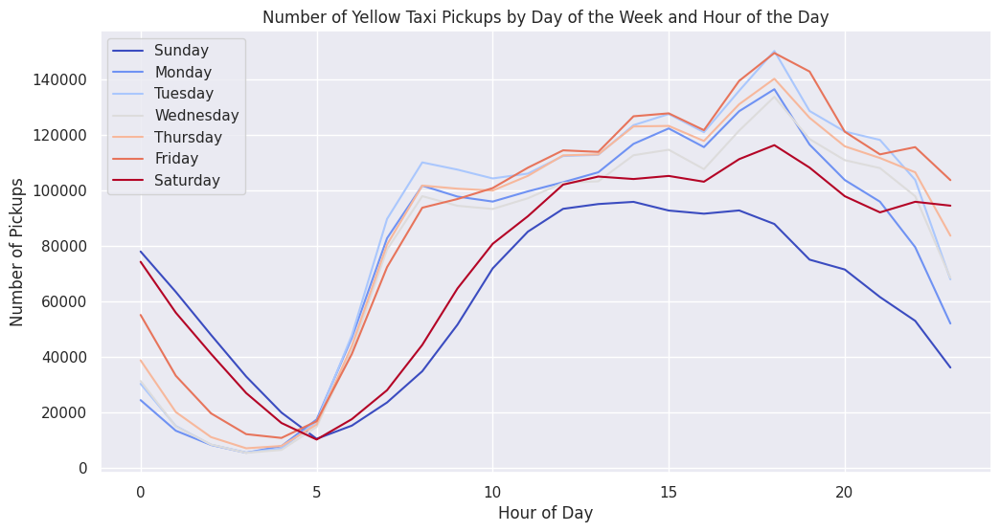

In [34]:
#For taxis
# Register the DataFrame as a temporary table
april_data_taxis.createOrReplaceTempView("april_data_taxis")

# Query to compute the number of pickups by day of the week and hour of the day
pickup_query = """
    SELECT
        DAYOFWEEK(tpep_pickup_datetime) AS day_of_week,
        HOUR(tpep_pickup_datetime) AS hour_of_day,
        COUNT(*) AS pickup_count
    FROM
        april_data_taxis
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""

# Execute the pickup query
pickup_result = spark.sql(pickup_query).toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
pickup_pivot = pickup_result.pivot(index='hour_of_day', columns='day_of_week', values='pickup_count')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
pickup_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Number of Pickups')
ax.set_title('Number of Yellow Taxi Pickups by Day of the Week and Hour of the Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()


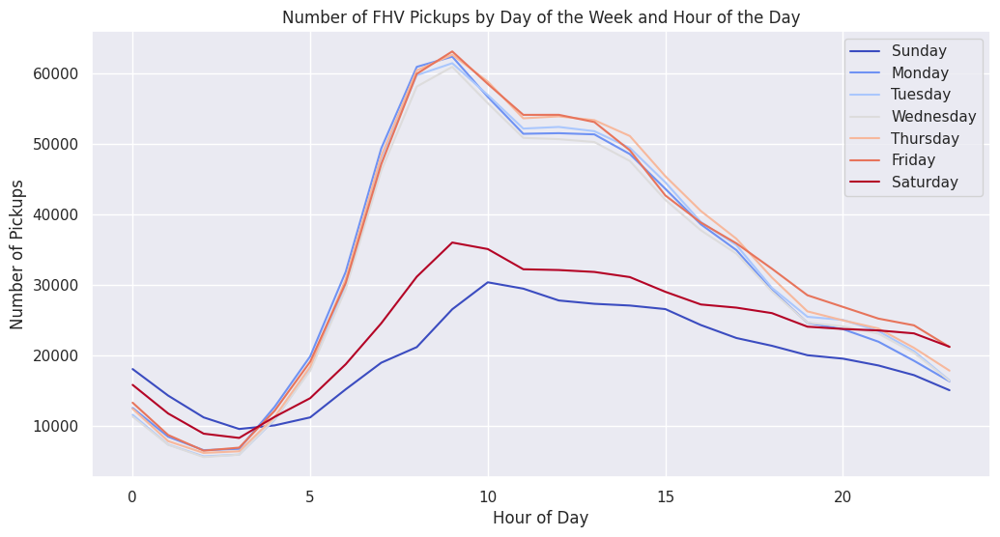

In [35]:
#For FHV
# Register the DataFrame as a temporary table
april_data_fhv.createOrReplaceTempView("april_data_fhv")

# Query to compute the number of pickups by day of the week and hour of the day
pickup_query = """
    SELECT
        DAYOFWEEK(pickup_datetime) AS day_of_week,
        HOUR(pickup_datetime) AS hour_of_day,
        COUNT(*) AS pickup_count
    FROM
        april_data_fhv
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""

# Execute the pickup query
pickup_result = spark.sql(pickup_query).toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
pickup_pivot = pickup_result.pivot(index='hour_of_day', columns='day_of_week', values='pickup_count')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
pickup_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Number of Pickups')
ax.set_title('Number of FHV Pickups by Day of the Week and Hour of the Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()


2. The average fare

    We are onlly able to do this with Taxis beacause the FHV data frame has no total amount column

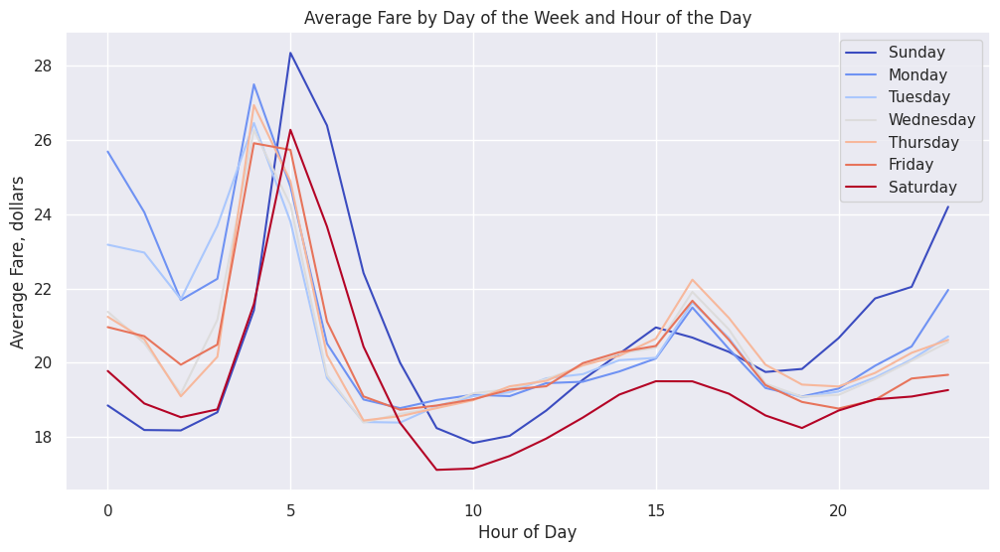

In [36]:
# Query to compute the average fare by day of the week and hour of the day
fare_query = """
    SELECT
        DAYOFWEEK(tpep_pickup_datetime) AS day_of_week,
        HOUR(tpep_pickup_datetime) AS hour_of_day,
        AVG(total_amount) AS avg_fare
    FROM
        april_data_taxis
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""

# Execute the fare query
fare_result = spark.sql(fare_query).toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
fare_pivot = fare_result.pivot(index='hour_of_day', columns='day_of_week', values='avg_fare')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
fare_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Average Fare, dollars')
ax.set_title('Average Fare by Day of the Week and Hour of the Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()


3. The average trip duration

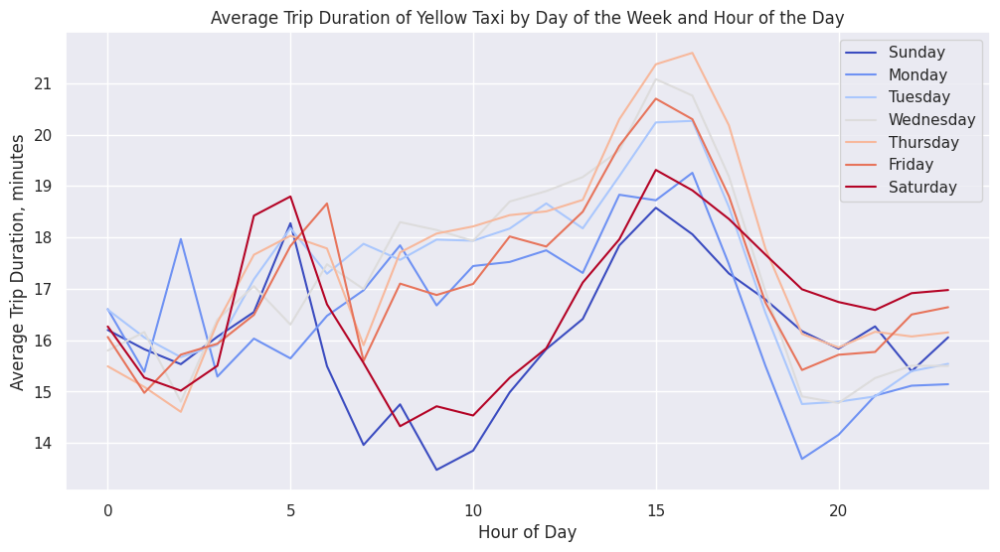

In [37]:
# For Taxis
# Query to compute the average trip duration by day of the week and hour of the day
duration_query = """
    SELECT
        DAYOFWEEK(tpep_pickup_datetime) AS day_of_week,
        HOUR(tpep_pickup_datetime) AS hour_of_day,
        AVG(trip_duration) AS avg_duration
    FROM
        april_data_taxis
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""

# Execute the duration query
duration_result = spark.sql(duration_query).toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
duration_pivot = duration_result.pivot(index='hour_of_day', columns='day_of_week', values='avg_duration')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
duration_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Average Trip Duration, minutes')
ax.set_title('Average Trip Duration of Yellow Taxi by Day of the Week and Hour of the Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()


**Rush hours at 6-8AM and especially at 4-7PM are clearly visible on the charts of Yellow Taxi**

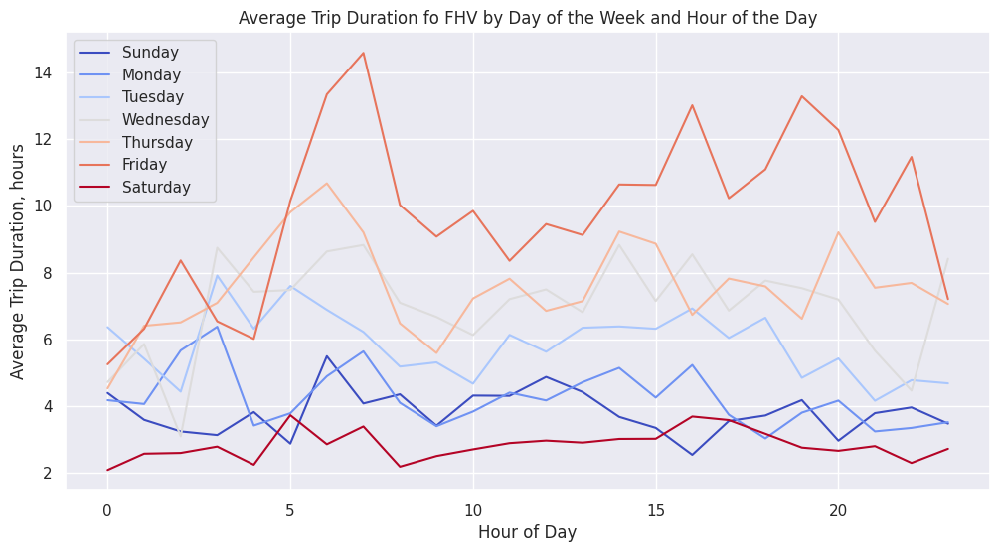

In [38]:
# Register the DataFrame as a temporary view
april_data_fhv.createOrReplaceTempView('april_data_fhv')

# Query to compute the average trip duration by day of the week and hour of the day
duration_query = """
    SELECT
        DAYOFWEEK(pickup_datetime) AS day_of_week,
        HOUR(pickup_datetime) AS hour_of_day,
        AVG(timestampdiff(HOUR, pickup_datetime, dropOff_datetime)) AS avg_duration
    FROM
        april_data_fhv
    WHERE
        pickup_datetime IS NOT NULL
        AND dropOff_datetime IS NOT NULL
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""

# Execute the duration query
duration_result = spark.sql(duration_query).toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
duration_pivot = duration_result.pivot(index='hour_of_day', columns='day_of_week', values='avg_duration')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
duration_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Average Trip Duration, hours')
ax.set_title('Average Trip Duration fo FHV by Day of the Week and Hour of the Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()

4. Plot the average of ongoing trips

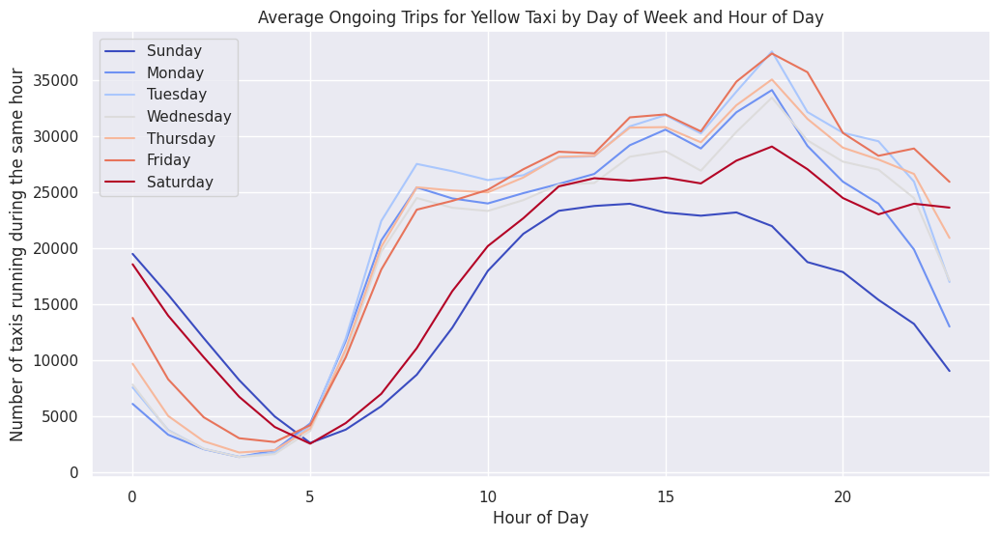

In [39]:
# Create a temporary view for the DataFrame
april_data_taxis.createOrReplaceTempView("april_data_taxis_view")

query1 = """
    SELECT
        DAYOFWEEK(tpep_pickup_datetime) AS day_of_week,
        HOUR(tpep_pickup_datetime) AS hour_of_day,
        YEAR(tpep_pickup_datetime) AS year,
        COUNT(*) AS nb_trips
    FROM
        april_data_taxis_view
    WHERE
        tpep_pickup_datetime IS NOT NULL
        AND tpep_pickup_datetime IS NOT NULL
    GROUP BY
        year,
        day_of_week,
        hour_of_day
    ORDER BY
        year,
        day_of_week,
        hour_of_day
"""
avg_ongoing = spark.sql(query1)
avg_ongoing.createOrReplaceTempView("avg_ongoing_temporary")

query2 = """
    SELECT
        day_of_week,
        hour_of_day,
        AVG(nb_trips) AS avg_ongoing_trips
    FROM
        avg_ongoing_temporary
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""
avg_ongoing2 = spark.sql(query2)

# Convert DataFrame to Pandas for plotting
avg_ongoing_pandas = avg_ongoing2.toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
avg_ongoing_pivot = avg_ongoing_pandas.pivot(index='hour_of_day', columns='day_of_week', values='avg_ongoing_trips')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
avg_ongoing_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Number of taxis running during the same hour')
ax.set_title('Average Ongoing Trips for Yellow Taxi by Day of Week and Hour of Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()

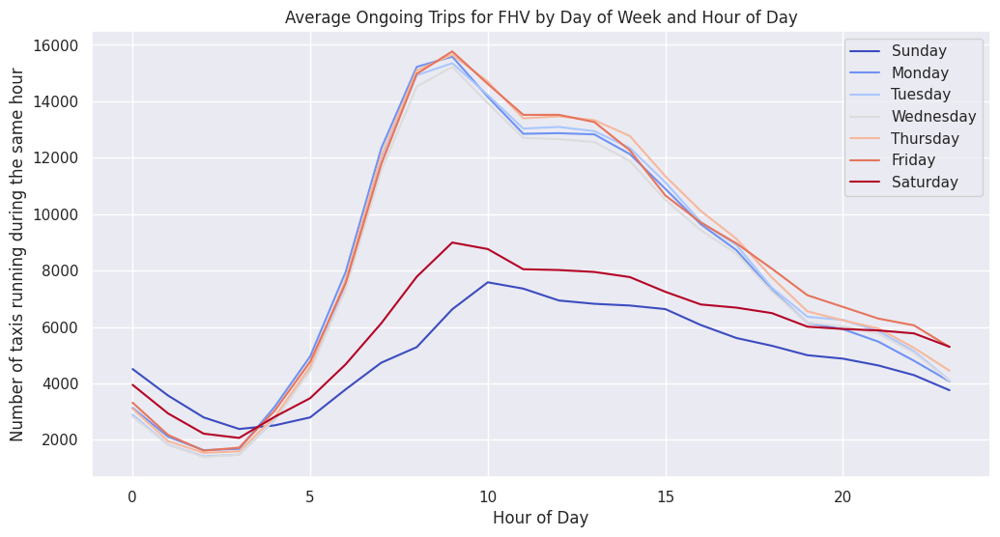

In [40]:
query1 = """
    SELECT
        DAYOFWEEK(pickup_datetime) AS day_of_week,
        HOUR(pickup_datetime) AS hour_of_day,
        YEAR(pickup_datetime) AS year,
        COUNT(*) AS nb_trips
    FROM
        april_data_fhv
    WHERE
        pickup_datetime IS NOT NULL
        AND dropOff_datetime IS NOT NULL
    GROUP BY
        year,
        day_of_week,
        hour_of_day
    ORDER BY
        year,
        day_of_week,
        hour_of_day
"""

avg_ongoing = spark.sql(query1)
avg_ongoing.createOrReplaceTempView("avg_ongoing_temp")

query2 = """
    SELECT
        day_of_week,
        hour_of_day,
        AVG(nb_trips) AS avg_ongoing_trips
    FROM
        avg_ongoing_temp
    GROUP BY
        day_of_week,
        hour_of_day
    ORDER BY
        day_of_week,
        hour_of_day
"""
avg_ongoing2 = spark.sql(query2)

# Convert DataFrame to Pandas for plotting
avg_ongoing_pandas = avg_ongoing2.toPandas()

avg_ongoing_pandas

# Pivot the data to create a table indexed by day of the week and hour of the day
avg_ongoing_pivot = avg_ongoing_pandas.pivot(index='hour_of_day', columns='day_of_week', values='avg_ongoing_trips')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
avg_ongoing_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Number of taxis running during the same hour')
ax.set_title('Average Ongoing Trips for FHV by Day of Week and Hour of Day')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()

### Rides to the airports

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK Airport

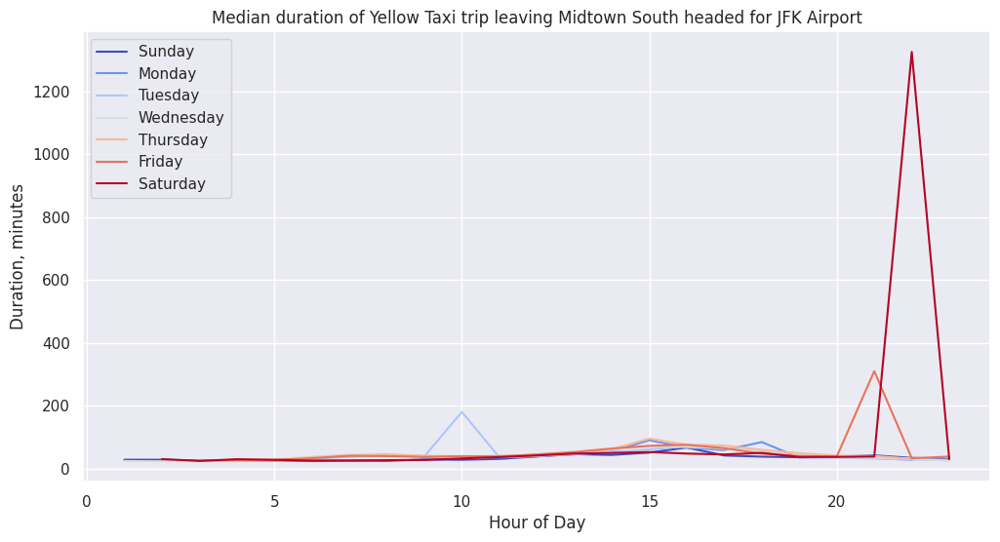

In [41]:
fromm = geo_df1.loc[geo_df1['zone'] == 'Midtown South', 'location_id'].values[0]
where = geo_df1.loc[geo_df1['zone'] == 'JFK Airport', 'location_id'].values[0]

to_airp = spark.sql("SELECT DAYOFWEEK(tpep_pickup_datetime) AS day_of_week, HOUR(tpep_pickup_datetime) AS hour_of_day, ROUND( AVG(timestampdiff(MINUTE, tpep_pickup_datetime, tpep_dropoff_datetime)), 1) AS med_duration FROM april_data_taxis_view WHERE PULocationID = {0} AND DOLocationID = {1} AND (HOUR(tpep_pickup_datetime) <> 0 AND MINUTE(tpep_pickup_datetime) <> 0) GROUP BY day_of_week, hour_of_day ORDER BY day_of_week, hour_of_day".format(fromm, where))
tt = to_airp.toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
med_pivot = tt.pivot(index='hour_of_day', columns='day_of_week', values='med_duration')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
med_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Duration, minutes')
ax.set_title('Median duration of Yellow Taxi trip leaving Midtown South headed for JFK Airport')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()


2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhattan)

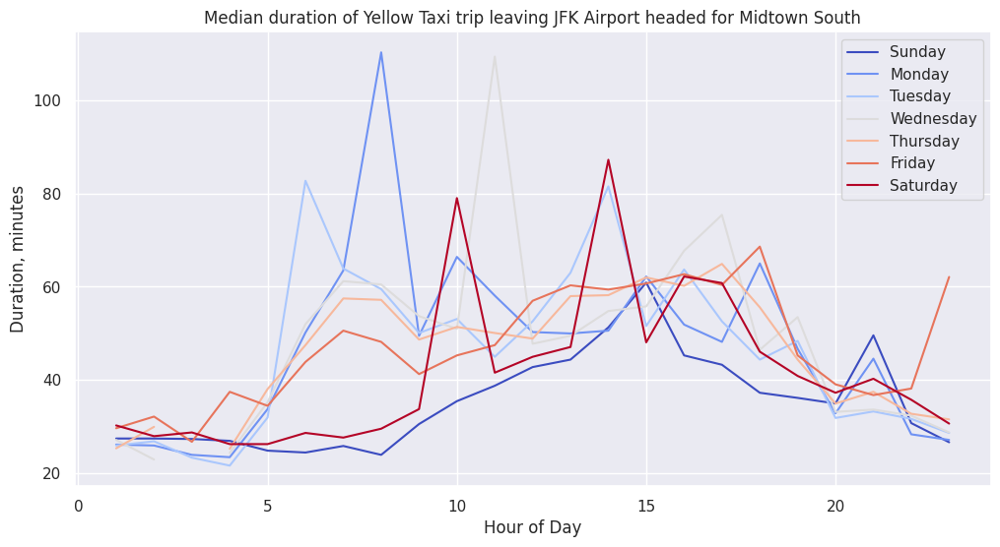

In [42]:
from_airp = spark.sql("SELECT DAYOFWEEK(tpep_pickup_datetime) AS day_of_week, HOUR(tpep_pickup_datetime) AS hour_of_day, ROUND( AVG(timestampdiff(MINUTE, tpep_pickup_datetime, tpep_dropoff_datetime)), 1) AS med_duration FROM april_data_taxis_view WHERE PULocationID = {0} AND DOLocationID = {1} AND HOUR(tpep_pickup_datetime) <> 0 GROUP BY day_of_week, hour_of_day ORDER BY day_of_week, hour_of_day".format(where, fromm))
tt = from_airp.toPandas()

# Pivot the data to create a table indexed by day of the week and hour of the day
med_pivot = tt.pivot(index='hour_of_day', columns='day_of_week', values='med_duration')

# Plotting the time series
fig, ax = plt.subplots(figsize=(12, 6))
med_pivot.plot(ax=ax, cmap='coolwarm')
ax.set_xlabel('Hour of Day')
ax.set_ylabel('Duration, minutes')
ax.set_title('Median duration of Yellow Taxi trip leaving JFK Airport headed for Midtown South')
ax.legend(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
plt.show()

### Geographic information

1. Build a heatmap where color is a function of
    1. number of pickups

,PULocationID,quantity,zone,borough
0,237,328923,Upper East Side South,Manhattan
1,161,318421,Midtown Center,Manhattan
2,236,299030,Upper East Side North,Manhattan
3,162,271700,Midtown East,Manhattan
4,186,256173,Penn Station/Madison Sq West,Manhattan
5,230,253724,Times Sq/Theatre District,Manhattan
6,48,233418,Clinton East,Manhattan
7,132,229647,JFK Airport,Queens
8,234,227658,Union Sq,Manhattan
9,170,225057,Murray Hill,Manhattan


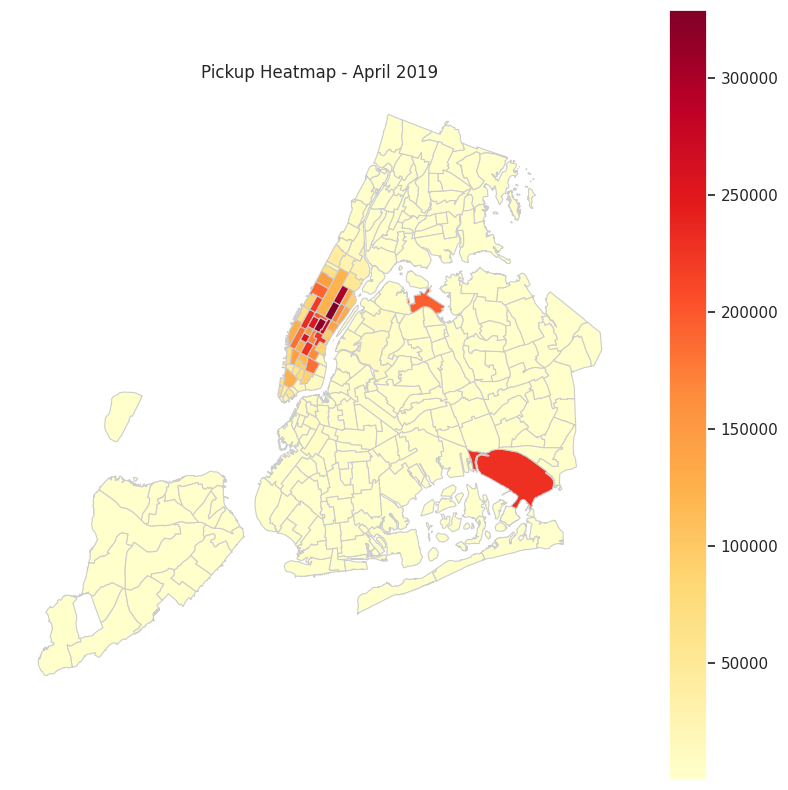

In [43]:
# Filter the data for a specific year
year = 2019
df_year = april_data_taxis.filter(april_data_taxis.tpep_pickup_datetime.contains(str(year)))

# Create a temporary view for the filtered data
df_year.createOrReplaceTempView("table1")

# Execute the SQL query to get pickup counts by location
req_str = """
    SELECT
        PULocationID, count(tpep_pickup_datetime) as quantity
    FROM
        table1
    GROUP BY
        PULocationID
    SORT BY
        quantity DESC
"""

nb_pickups = spark.sql(req_str).toPandas()
nb_pickups = nb_pickups.merge(boroughs_zones, left_on='PULocationID', right_on='location_id')

display(nb_pickups[['PULocationID', 'quantity', 'zone', 'borough']].head(20))

# Merge pickup counts with GeoDataFrame
df_pickups = geo_df1.merge(nb_pickups, left_on='location_id', right_on='PULocationID', how='left')

# Plotting the heatmap on NYC shape
fig, ax = plt.subplots(figsize=(10, 10))
df_pickups.plot(column='quantity', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.axis('off')
ax.set_title('Pickup Heatmap - April {}'.format(year))
plt.show()


   B. number of dropoffs

,DOLocationID,quantity,zone,borough
0,236,314965,Upper East Side North,Manhattan
1,237,297536,Upper East Side South,Manhattan
2,161,292867,Midtown Center,Manhattan
3,170,230548,Murray Hill,Manhattan
4,230,225542,Times Sq/Theatre District,Manhattan
5,162,223093,Midtown East,Manhattan
6,48,200839,Clinton East,Manhattan
7,142,200388,Lincoln Square East,Manhattan
8,234,196855,Union Sq,Manhattan
9,239,184599,Upper West Side South,Manhattan


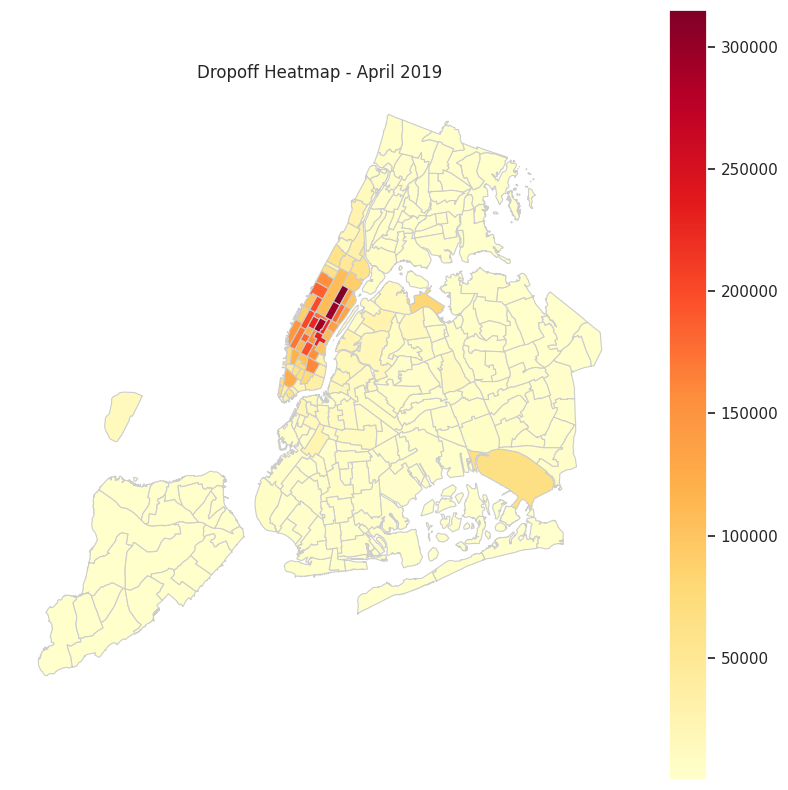

In [44]:
# Execute the SQL query to get pickup counts by location
req_str = """
    SELECT
        DOLocationID, count(tpep_dropoff_datetime) as quantity
    FROM
        table1
    GROUP BY
        DOLocationID
    SORT BY
        quantity DESC
"""

nb_dropoffs = spark.sql(req_str).toPandas()
nb_dropoffs = nb_dropoffs.merge(boroughs_zones, left_on='DOLocationID', right_on='location_id')

display(nb_dropoffs[['DOLocationID', 'quantity', 'zone', 'borough']].head(20))

# Merge pickup counts with GeoDataFrame
nb_dropoffs = geo_df1.merge(nb_dropoffs, left_on='location_id', right_on='DOLocationID', how='left')

# Plotting the heatmap on NYC shape
fig, ax = plt.subplots(figsize=(10, 10))
nb_dropoffs.plot(column='quantity', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.axis('off')
ax.set_title('Dropoff Heatmap - April {}'.format(year))
plt.show()


   C.number of pickups with dropoff at airport JFK

,PULocationID,pickup_count,zone,borough
0,132,9612,JFK Airport,Queens
1,230,4465,Times Sq/Theatre District,Manhattan
2,161,3624,Midtown Center,Manhattan
3,170,2992,Murray Hill,Manhattan
4,138,2836,LaGuardia Airport,Queens
5,162,2807,Midtown East,Manhattan
6,163,2579,Midtown North,Manhattan
7,164,2200,Midtown South,Manhattan
8,233,1846,UN/Turtle Bay South,Manhattan
9,48,1760,Clinton East,Manhattan


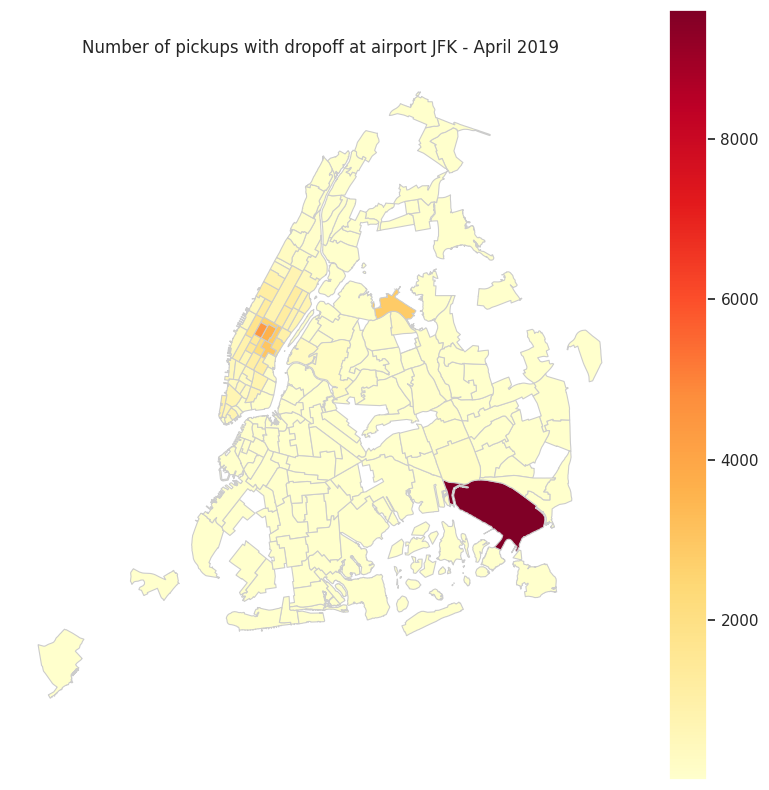

In [45]:
# Filter the data for pickups with dropoff at JFK airport
jfk = geo_df1.loc[geo_df1['zone'] == 'JFK Airport', 'location_id'].values[0]

df_pu = spark.sql("SELECT PULocationID, count(*) as pickup_count FROM table1 WHERE DOLocationID = {0} GROUP BY PULocationID SORT BY pickup_count DESC".format(jfk))

# Convert the Spark DataFrame to a Pandas DataFrame
df_to_jfk = df_pu.toPandas()

# Merge pickup counts with GeoDataFrame
df_to_jfk = df_to_jfk.merge(boroughs_zones, left_on='PULocationID', right_on='location_id')
display(df_to_jfk[['PULocationID', 'pickup_count', 'zone', 'borough']].head(20))

# Merge pickup counts with GeoDataFrame
df_to_jfk = geo_df1.merge(df_to_jfk, left_on='location_id', right_on='PULocationID', how='left')

# Plotting the heatmap on NYC shape
fig, ax = plt.subplots(figsize=(10, 10))
df_to_jfk.plot(column='pickup_count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.axis('off')
ax.set_title('Number of pickups with dropoff at airport JFK - April {}'.format(year))
plt.show()

2. Build a choropeth map where color is a function of
    1. number of pickups in the area

In [46]:
# Execute the SQL query to get pickup counts by location
req_str = """
    SELECT
        PULocationID, count(tpep_pickup_datetime) as quantity
    FROM
        table1
    GROUP BY
        PULocationID
    SORT BY
        quantity DESC
"""

nb_pickups = spark.sql(req_str).toPandas()
nb_pickups = nb_pickups.merge(boroughs_zones, left_on='PULocationID', right_on='location_id')

display(nb_pickups[['PULocationID', 'quantity', 'zone', 'borough']].head(20))

# show
m = folium.Map(location=[40.7594,-73.9549], zoom_start=10, width=900, height=500)
folium.Choropleth(
    geo_data = geo_df1,
    name = 'NYC_pickups_choropleth',
    data = df_pickups,
    columns=['PULocationID', 'quantity'],
    key_on = 'feature.properties.location_id',
    fill_color = 'YlGnBu',
    legend_name='Number of pickups in April 2019'
).add_to(m)

m

,PULocationID,quantity,zone,borough
0,237,328923,Upper East Side South,Manhattan
1,161,318421,Midtown Center,Manhattan
2,236,299030,Upper East Side North,Manhattan
3,162,271700,Midtown East,Manhattan
4,186,256173,Penn Station/Madison Sq West,Manhattan
5,230,253724,Times Sq/Theatre District,Manhattan
6,48,233418,Clinton East,Manhattan
7,132,229647,JFK Airport,Queens
8,234,227658,Union Sq,Manhattan
9,170,225057,Murray Hill,Manhattan


   B.ratio of number of payments by card/number of cash payments for pickups in the area

In [47]:
# Create a temporary view for the filtered data
df_year.createOrReplaceTempView("table1")

# Execute the SQL query to get pickup counts by location and payment type
req_str = """
    SELECT
        PULocationID,
        SUM(CASE WHEN Payment_type = 1 THEN 1 ELSE 0 END) AS card_payments,
        SUM(CASE WHEN Payment_type = 2 THEN 1 ELSE 0 END) AS cash_payments
    FROM
        table1
    GROUP BY
        PULocationID
"""

nb_ratio = spark.sql(req_str).toPandas()
nb_ratio = nb_ratio.merge(boroughs_zones, left_on='PULocationID', right_on='location_id')

# Calculate the ratio of card payments to cash payments
nb_ratio['payment_ratio'] = nb_ratio['card_payments'] / nb_ratio['cash_payments']

# Filter out rows with infinite or non-finite values
nb_ratio = nb_ratio[np.isfinite(nb_ratio['payment_ratio'])]

display(nb_ratio[['PULocationID', 'payment_ratio','zone', 'borough']].head(20))

# show
# show
m = folium.Map(location=[40.7594,-73.9549], zoom_start=10, width=900, height=500)
folium.Choropleth(
    geo_data=geo_df1,
    name='NYC_payment_ratio_choropleth',
    data=nb_ratio,
    columns=['PULocationID', 'payment_ratio'],
    key_on='feature.properties.location_id',
    fill_color='YlGnBu',
    legend_name='Payment ratio in April 2019'
).add_to(m)
m

,PULocationID,payment_ratio,zone,borough
0,148,3.113480,Lower East Side,Manhattan
1,243,1.316434,Washington Heights North,Manhattan
2,31,2.450000,Bronx Park,Bronx
3,137,2.987981,Kips Bay,Manhattan
4,85,3.714286,Erasmus,Brooklyn
5,251,6.000000,Westerleigh,Staten Island
6,65,1.892902,Downtown Brooklyn/MetroTech,Brooklyn
7,255,2.348361,Williamsburg (North Side),Brooklyn
8,53,3.869565,College Point,Queens
9,133,1.296296,Kensington,Brooklyn


C.ratio of total fare/trip duration for dropoff in the area

In [48]:
# Create a temporary view for the filtered data
df_year.createOrReplaceTempView("table1")

# Execute the SQL query to get dropoff ratios by location
req_str = """
    SELECT
        DOLocationID,
        SUM(Total_amount) / SUM(trip_duration) AS dropoff_ratio
    FROM
        table1
    GROUP BY
        DOLocationID
"""

nb_dropoff = spark.sql(req_str).toPandas()
nb_dropoff = nb_dropoff.merge(boroughs_zones, left_on='DOLocationID', right_on='location_id')

# Filter out rows with infinite or non-finite values
nb_dropoff = nb_dropoff[np.isfinite(nb_dropoff['dropoff_ratio'])]

display(nb_dropoff[['DOLocationID', 'dropoff_ratio','zone', 'borough']].head(20))

# show
m = folium.Map(location=[40.7594,-73.9549], zoom_start=10, width=900, height=500)
folium.Choropleth(
    geo_data=geo_df1,
    name='NYC_Dropoff_ratio_choropleth',
    data=nb_dropoff,
    columns=['DOLocationID', 'dropoff_ratio'],
    key_on='feature.properties.location_id',
    fill_color='YlGnBu',
    legend_name='Dropoff ratio in April 2019'
).add_to(m)
m


,DOLocationID,dropoff_ratio,zone,borough
0,148,0.964407,Lower East Side,Manhattan
1,243,1.235478,Washington Heights North,Manhattan
2,31,1.086473,Bronx Park,Bronx
3,137,1.156220,Kips Bay,Manhattan
4,85,0.951272,Erasmus,Brooklyn
5,251,1.575811,Westerleigh,Staten Island
6,65,1.009523,Downtown Brooklyn/MetroTech,Brooklyn
7,255,1.011094,Williamsburg (North Side),Brooklyn
8,53,1.092588,College Point,Queens
9,133,1.072013,Kensington,Brooklyn


3. Build an interactive chorophet with a slider allowing the user to select an hour of day
and where the color is a function of
      1. average number of dropoffs in the area during that hour the day -->

In [51]:
# Filter the data for a specific day
day = '2019-04-01'
df_day = april_data_taxis.filter(april_data_taxis.tpep_dropoff_datetime.contains(day))

# Create a temporary view for the filtered data
df_day.createOrReplaceTempView("table1")

# Define the slider for selecting the hour of the day
hour_slider = widgets.IntSlider(value=0, min=0, max=23, step=1, description='Hour of Day')

# Execute the SQL query to get average dropoff counts by location and hour of the day
req_str = """
    SELECT
        DOLocationID,
        HOUR(tpep_dropoff_datetime) AS hour_of_day,
        AVG(1) AS avg_dropoffs
    FROM
        table1
    WHERE
        HOUR(tpep_dropoff_datetime) = {}
    GROUP BY
        DOLocationID, hour_of_day
""".format(hour_slider.value)

dropoffSQL = spark.sql(req_str)
pdSQL = dropoffSQL.toPandas()
pdSQL = pdSQL.merge(boroughs_zones, left_on='DOLocationID', right_on='location_id')

# Merge average dropoff counts with GeoDataFrame
geo_df_with_avg_dropoffs = geo_df1.merge(pdSQL, left_on='location_id', right_on='location_id', how='left')

# Calculate the range for color normalization
max_avg_dropoffs = geo_df_with_avg_dropoffs['avg_dropoffs'].max()
min_avg_dropoffs = geo_df_with_avg_dropoffs['avg_dropoffs'].min()

# Create a color map for the choropleth
cmap = plt.cm.get_cmap('YlOrRd')
norm = colors.Normalize(vmin=min_avg_dropoffs, vmax=max_avg_dropoffs)

# Function to style the GeoJSON features
def style_function(feature):
    avg_dropoffs = feature['properties']['avg_dropoffs']
    color = colors.rgb2hex(cmap(norm(avg_dropoffs)))
    return {
        'fillOpacity': 0.7,
        'weight': 0.5,
        'color': 'black',
        'fillColor': color
    }

# Create the folium map centered at NYC
map_nyc = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

# Add the GeoJSON layer with styled features
folium.GeoJson(
    geo_df_with_avg_dropoffs,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=['avg_dropoffs'], labels=False, sticky=False)
).add_to(map_nyc)

# Save the map to HTML file
map_nyc.save('map.html')

# Display the map using an iframe
IFrame(src='map.html', width='100%', height=500)




<ipython-input-51-0f4fd295e60b>:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('YlOrRd')


### Covid impact

We can clearly see the effect of COVID-19 in the number of trips taken before and after 2020, for both taxis and fhv.

It can be also stated that after the pandemic, the use of taxis in New York did not recover to pre-COVID levels.

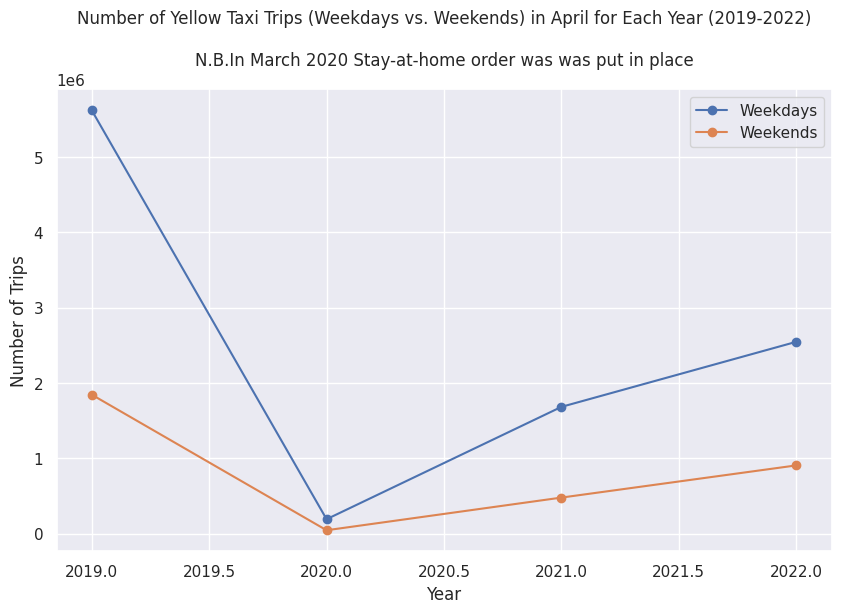

In [57]:
# Query for weekdays in April
weekday_query = """
SELECT
    YEAR(c.tpep_pickup_datetime) AS year,
    COUNT(*) AS weekday_trip_count
FROM
    combined_taxis2 as c
WHERE
    MONTH(c.tpep_pickup_datetime) = 4
    AND DAYOFWEEK(c.tpep_pickup_datetime) NOT IN (1, 7) -- Exclude Sunday (1) and Saturday (7)
GROUP BY
    year
ORDER BY
    year
"""

# Query for weekends in April
weekend_query = """
SELECT
    YEAR(c.tpep_pickup_datetime) AS year,
    COUNT(*) AS weekend_trip_count
FROM
    combined_taxis2 as c
WHERE
    MONTH(c.tpep_pickup_datetime) = 4
    AND DAYOFWEEK(c.tpep_pickup_datetime) IN (1, 7) -- Only include Sunday (1) and Saturday (7)
GROUP BY
    year
ORDER BY
    year
"""

# Execute weekday query
weekday_pd_df = spark.sql(weekday_query).toPandas()

# Execute weekend query
weekend_pd_df = spark.sql(weekend_query).toPandas()

# Merge the weekday and weekend dataframes
merged_df = pd.merge(weekday_pd_df, weekend_pd_df, on='year')


# Calculate the difference between weekday and weekend trips
merged_df['trip_count_difference'] = merged_df['weekday_trip_count'] - merged_df['weekend_trip_count']

# Plotting the chart
plt.figure(figsize=(10, 6))
plt.plot(merged_df['year'], merged_df['weekday_trip_count'], marker='o', label='Weekdays')
plt.plot(merged_df['year'], merged_df['weekend_trip_count'], marker='o', label='Weekends')
plt.xlabel('Year')
plt.ylabel('Number of Trips')
plt.title('Number of Yellow Taxi Trips (Weekdays vs. Weekends) in April for Each Year (2019-2022)\n\nN.B.In March 2020 Stay-at-home order was was put in place')
plt.legend()
plt.show()

Yellow Taxi query completed in 15.16680121421814 seconds
FHV query completed in 6.011276483535767 seconds


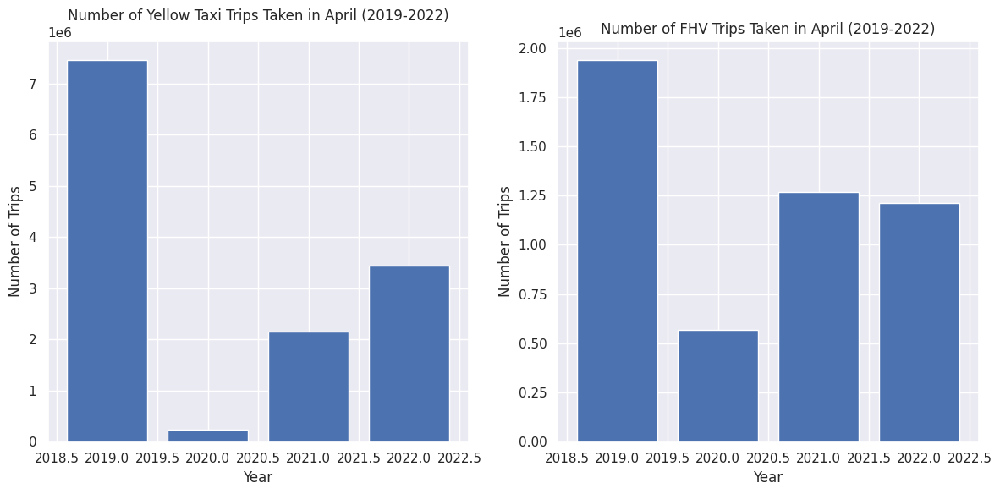

In [58]:
# Query for yellow taxis
yellow_taxi_query = """
SELECT
    YEAR(c.tpep_pickup_datetime) AS year,
    COUNT(*) AS trip_count
FROM
    combined_taxis2 as c
WHERE
    MONTH(c.tpep_pickup_datetime) = 4
    AND YEAR(c.tpep_pickup_datetime) IN (2019, 2020, 2021, 2022)
GROUP BY
    year
"""

# Query for FHV
fhv_query =  """
SELECT
    YEAR(c.pickup_datetime) AS year,
    COUNT(*) AS trip_count
FROM
    combined_fhv2 as c
WHERE
    MONTH(c.pickup_datetime) = 4
    AND YEAR(c.pickup_datetime) IN (2019, 2020, 2021, 2022)
GROUP BY
    year
"""
# Execute yellow taxi query
start = time.time()
yellow_taxi_pd_df = spark.sql(yellow_taxi_query).toPandas()
print(f"Yellow Taxi query completed in {time.time() - start} seconds")

# Execute FHV query
start = time.time()
fhv_pd_df = spark.sql(fhv_query).toPandas()
print(f"FHV query completed in {time.time() - start} seconds")

# Plotting the comparison chart
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plotting yellow taxi chart
ax1.bar(yellow_taxi_pd_df['year'], yellow_taxi_pd_df['trip_count'])
ax1.set_xlabel('Year')
ax1.set_ylabel('Number of Trips')
ax1.set_title('Number of Yellow Taxi Trips Taken in April (2019-2022)')

# Plotting FHV chart
ax2.bar(fhv_pd_df['year'], fhv_pd_df['trip_count'])
ax2.set_xlabel('Year')
ax2.set_ylabel('Number of Trips')
ax2.set_title('Number of FHV Trips Taken in April (2019-2022)')

plt.tight_layout()
plt.show()